#IMPORTING LIBRARIES



In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive',force_remount=True)
os.chdir('/content/drive/Shared drives/DATA240/Data')
import warnings
warnings.filterwarnings("ignore")

Mounted at /content/drive


In [ ]:

!pip install scikit-plot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd
pd.options.display.max_columns = None
pd.options.display.max_rows = None
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.feature_selection import f_classif
from collections import Counter
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectFromModel
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest, chi2
import scikitplot as skplt
from sklearn import tree

#LOADING DATA

In [ ]:
# accidents_df = pd.read_csv('Accidents.csv',index_col='Accident_Index')

In [ ]:
# accidents_df.head()

In [ ]:
# casualties_df = pd.read_csv('Casualties.csv', error_bad_lines=False,index_col='Accident_Index',warn_bad_lines=False)

In [ ]:
# casualties_df.head()

In [ ]:
# vehicles_df = pd.read_csv('Vehicles.csv', error_bad_lines=False,index_col='Accident_Index',warn_bad_lines=False)

In [ ]:
# vehicles_df.head()

# Merge the files here:
  next step:
  df.shape()
  look head
  check for the count of nulls and percentage
  df.info()

##JOINING TABLES

In [ ]:
# merged_df = pd.merge(accidents_df, vehicles_df, on='Accident_Index')
# merged_df = pd.merge(merged_df, casualties_df, on='Accident_Index')

# Write the merged DataFrame to a new CSV file
# merged_df.to_csv('merged.csv', index=False)

In [ ]:
dataset = pd.read_csv('/content/drive/Shared drives/DATA240/Data/merged.csv')

In [ ]:
dataset.head()

,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_(District),Local_Authority_(Highway),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Vehicle_Reference_x,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location-Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive?,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_Reference_y,Casualty_Reference,Casualty_Class,Sex_of_Casualty,Age_of_Casualty,Age_Band_of_Casualty,Casualty_Severity,Pedestrian_Location,Pedestrian_Movement,Car_Passenger,Bus_or_Coach_Passenger,Pedestrian_Road_Maintenance_Worker,Casualty_Type,Casualty_Home_Area_Type
0,525680.0,178240.0,-0.191170,51.489096,1,2,1,1,04/01/2005,3,17:42,12,E09000020,3,3218,6,30,0,-1,-1,0,0,1,1,2,2,0,0,1,1,E01002849,1.0,9.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,15.0,2.0,74.0,10.0,-1.0,-1.0,-1.0,7.0,1.0,1.0,1.0,3.0,1.0,37.0,7.0,2.0,1.0,1.0,0.0,0.0,-1.0,0.0,1.0
1,524170.0,181650.0,-0.211708,51.520075,1,3,1,1,05/01/2005,4,17:36,12,E09000020,4,450,3,30,6,2,5,0,0,5,4,1,1,0,0,1,1,E01002909,1.0,11.0,0.0,4.0,0.0,3.0,0.0,0.0,0.0,0.0,4.0,1.0,1.0,1.0,42.0,7.0,8268.0,2.0,3.0,-1.0,-1.0,1.0,1.0,2.0,1.0,37.0,7.0,3.0,0.0,0.0,0.0,4.0,-1.0,11.0,1.0
2,524520.0,182240.0,-0.206458,51.525301,1,3,2,1,06/01/2005,5,00:15,12,E09000020,5,0,6,30,0,-1,-1,0,0,0,4,1,1,0,0,1,1,E01002857,1.0,11.0,0.0,17.0,0.0,0.0,0.0,4.0,0.0,0.0,4.0,1.0,1.0,1.0,35.0,6.0,8300.0,2.0,5.0,2.0,1.0,2.0,1.0,1.0,1.0,62.0,9.0,3.0,0.0,0.0,0.0,0.0,-1.0,9.0,1.0
3,524520.0,182240.0,-0.206458,51.525301,1,3,2,1,06/01/2005,5,00:15,12,E09000020,5,0,6,30,0,-1,-1,0,0,0,4,1,1,0,0,1,1,E01002857,2.0,9.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,15.0,1.0,62.0,9.0,1762.0,1.0,6.0,1.0,1.0,2.0,1.0,1.0,1.0,62.0,9.0,3.0,0.0,0.0,0.0,0.0,-1.0,9.0,1.0
4,526900.0,177530.0,-0.173862,51.482442,1,3,1,1,07/01/2005,6,10:35,12,E09000020,3,3220,6,30,0,-1,-1,0,0,0,1,1,1,0,0,1,1,E01002840,1.0,9.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,15.0,2.0,49.0,8.0,1769.0,1.0,4.0,2.0,1.0,1.0,1.0,3.0,1.0,30.0,6.0,3.0,5.0,2.0,0.0,0.0,-1.0,0.0,1.0


In [ ]:
dataset.shape

(4427649, 66)

#Cleaning

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4427649 entries, 0 to 4427648
Data columns (total 66 columns):
 #   Column                                       Dtype  
---  ------                                       -----  
 0   Location_Easting_OSGR                        float64
 1   Location_Northing_OSGR                       float64
 2   Longitude                                    float64
 3   Latitude                                     float64
 4   Police_Force                                 int64  
 5   Accident_Severity                            int64  
 6   Number_of_Vehicles                           int64  
 7   Number_of_Casualties                         int64  
 8   Date                                         object 
 9   Day_of_Week                                  int64  
 10  Time                                         object 
 11  Local_Authority_(District)                   int64  
 12  Local_Authority_(Highway)                    object 
 13  1st_Road_Cla

In [ ]:
dataset.shape

(4427649, 66)

In [ ]:
dataset.replace(-1, np.nan, inplace=True)

In [ ]:
null_percentage = (dataset.isnull().sum() / len(dataset)) * 100
null_percentage.sort_values(ascending=False)

Pedestrian_Road_Maintenance_Worker             65.944387
2nd_Road_Class                                 41.636160
Junction_Control                               35.933133
Driver_IMD_Decile                              29.422703
Age_of_Vehicle                                 29.260314
Engine_Capacity_(CC)                           26.396514
Propulsion_Code                                25.797212
Driver_Home_Area_Type                          20.891177
Casualty_Home_Area_Type                        16.749114
Age_Band_of_Driver                             12.325277
Age_of_Driver                                  12.325277
LSOA_of_Accident_Location                       6.586069
Age_of_Casualty                                 5.104944
Age_Band_of_Casualty                            5.104944
Journey_Purpose_of_Driver                       4.593002
Was_Vehicle_Left_Hand_Drive?                    3.922759
Junction_Location                               3.474191
1st_Point_of_Impact            

In [ ]:
null_percentage = (dataset.isnull().sum() / len(dataset)) * 100
null_columns = list(null_percentage[null_percentage >= 30].index)
dataset = dataset.drop(null_columns, axis=1)
print(' Dropping ',len(null_columns),'features ')

 Dropping  3 features 


In [ ]:
dataset.shape

(4427649, 63)

In [ ]:
null_percentage = (dataset.isnull().sum() / len(dataset)) * 100
null_percentage.sort_values(ascending=False)

Driver_IMD_Decile                              29.422703
Age_of_Vehicle                                 29.260314
Engine_Capacity_(CC)                           26.396514
Propulsion_Code                                25.797212
Driver_Home_Area_Type                          20.891177
Casualty_Home_Area_Type                        16.749114
Age_Band_of_Driver                             12.325277
Age_of_Driver                                  12.325277
LSOA_of_Accident_Location                       6.586069
Age_of_Casualty                                 5.104944
Age_Band_of_Casualty                            5.104944
Journey_Purpose_of_Driver                       4.593002
Was_Vehicle_Left_Hand_Drive?                    3.922759
Junction_Location                               3.474191
1st_Point_of_Impact                             3.217825
Vehicle_Manoeuvre                               3.193004
Sex_of_Casualty                                 3.190135
Car_Passenger                  

The Age_Band_of_Driver column is dropped as we are considering the Age_of_Driver column.

The Age_Band_of_Casualty column is dropped as we are considering the Age_of_Casuality column.

The Journey_Purpose_of_Driver column as it has no significance with the problem statement.


The Was_Vehicle_Left_Hand_Drive column is dropped as it has no significance with the problem statement.

Dropping Vehicle_Reference_y and Vehicle_Reference_x as they are a unique value for each vehicle in a singular accident.

In [ ]:
# Drop a particular column
dataset = dataset.drop(['Age_Band_of_Driver','Age_Band_of_Casualty','Journey_Purpose_of_Driver','Was_Vehicle_Left_Hand_Drive?','Vehicle_Reference_y','Vehicle_Reference_x'], axis=1)


In [ ]:
dataset.shape

(4427649, 57)

Checking the NULL Values

## Column: Driver_IMD_Decile 

In [ ]:
dataset['Driver_IMD_Decile'].value_counts().sort_values()

10.0    271756
9.0     294294
8.0     303152
7.0     309416
5.0     321249
6.0     321621
4.0     324644
3.0     324986
1.0     326878
2.0     326919
Name: Driver_IMD_Decile, dtype: int64

In [ ]:
# As this column is categorical, we are replacing missing values with the mode category i.e. category 2.
dataset['Driver_IMD_Decile'] = dataset['Driver_IMD_Decile'].fillna(2)

In [ ]:
dataset['Driver_IMD_Decile'].isna().sum()

0

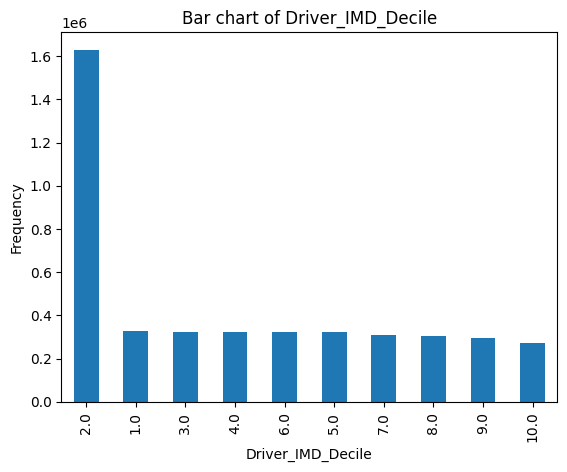

In [ ]:
# Select a categorical column of interest
cat_column = 'Driver_IMD_Decile'

# Count the frequency of each category
cat_counts = dataset[cat_column].value_counts()

# Plot a bar chart of the category frequencies
cat_counts.plot.bar()

# Set the title and axis labels
plt.title('Bar chart of ' + cat_column)
plt.xlabel(cat_column)
plt.ylabel('Frequency')

# Display the plot
plt.show()

## Column: Age_of_Vehicle


In [ ]:
dataset['Age_of_Vehicle'].describe()

count    3.132105e+06
mean     7.242032e+00
std      4.473653e+00
min      1.000000e+00
25%      4.000000e+00
50%      7.000000e+00
75%      1.000000e+01
max      1.110000e+02
Name: Age_of_Vehicle, dtype: float64

<Axes: >

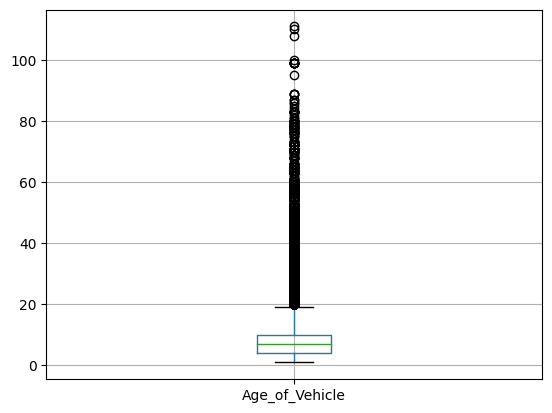

In [ ]:
dataset.boxplot(column='Age_of_Vehicle')

In [ ]:
Q1 = dataset['Age_of_Vehicle'].quantile(0.25)
Q3 = dataset['Age_of_Vehicle'].quantile(0.75)
IQR = Q3 - Q1
#print(Q1)
# Calculate the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print(lower_bound,upper_bound)
# Create a boolean mask to identify outliers
outliers = (dataset['Age_of_Vehicle'] < lower_bound) | (dataset['Age_of_Vehicle'] > upper_bound)

# Count the number of outliers
outlier_count = outliers.sum()
outlier_count

-5.0 19.0


27786

In [ ]:
(outlier_count/dataset.shape[0])*100

0.627556520401685

In [ ]:
dataset['Age_of_Vehicle'].median()

7.0

In [ ]:
dataset.loc[(dataset['Age_of_Vehicle'] >= upper_bound) | (dataset['Age_of_Vehicle'] <= lower_bound), 'Age_of_Vehicle'] = 7

In [ ]:
outliers = (dataset['Age_of_Vehicle'] < lower_bound) | (dataset['Age_of_Vehicle'] > upper_bound)

# Count the number of outliers
outlier_count = outliers.sum()
outlier_count

0

<Axes: >

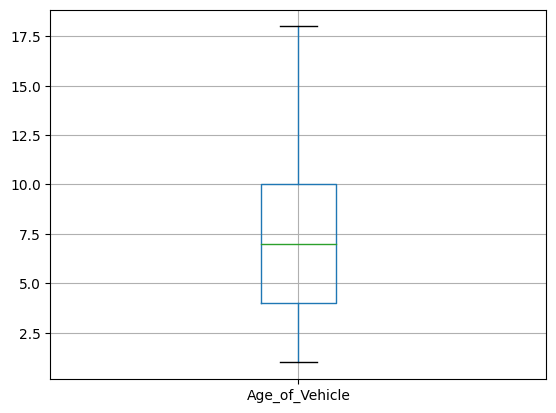

In [ ]:
dataset.boxplot(column='Age_of_Vehicle')

In [ ]:
#Filling the null values

dataset['Age_of_Vehicle'] = dataset['Age_of_Vehicle'].fillna(7)

## Engine_Capacity_(CC)

In [ ]:
dataset['Engine_Capacity_(CC)'].describe()

count    3.258904e+06
mean     1.932122e+03
std      1.676228e+03
min      1.000000e+00
25%      1.299000e+03
50%      1.598000e+03
75%      1.995000e+03
max      9.999900e+04
Name: Engine_Capacity_(CC), dtype: float64

<Axes: >

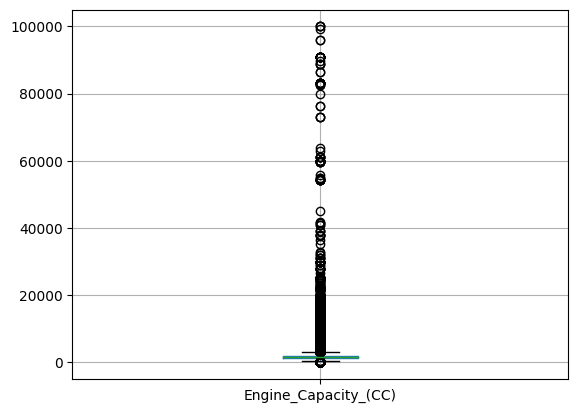

In [ ]:
dataset.boxplot(column='Engine_Capacity_(CC)')

In [ ]:
Q1 = dataset['Engine_Capacity_(CC)'].quantile(0.25)
Q3 = dataset['Engine_Capacity_(CC)'].quantile(0.75)
IQR = Q3 - Q1
#print(Q1)
# Calculate the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print(lower_bound,upper_bound)
# Create a boolean mask to identify outliers
outliers = (dataset['Engine_Capacity_(CC)'] < lower_bound) | (dataset['Engine_Capacity_(CC)'] > upper_bound)

# Count the number of outliers
outlier_count = outliers.sum()
outlier_count

255.0 3039.0


295630

In [ ]:
(outlier_count/dataset.shape[0])*100

6.676906864116826

In [ ]:
dataset['Engine_Capacity_(CC)'].median()

1598.0

In [ ]:
dataset.loc[(dataset['Engine_Capacity_(CC)'] >= upper_bound) | (dataset['Engine_Capacity_(CC)'] <= lower_bound), 'Engine_Capacity_(CC)'] = 1598

In [ ]:
outliers = (dataset['Engine_Capacity_(CC)'] < lower_bound) | (dataset['Engine_Capacity_(CC)'] > upper_bound)

# Count the number of outliers
outlier_count = outliers.sum()
outlier_count

0

<Axes: >

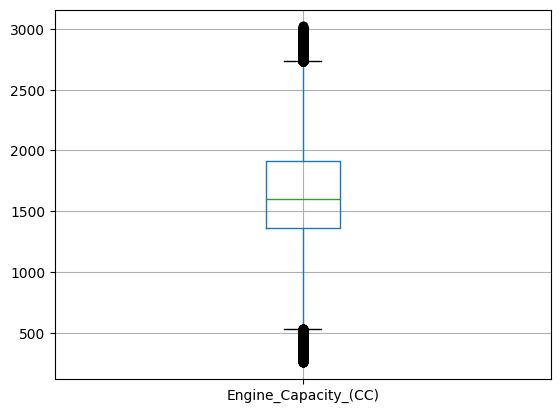

In [ ]:
dataset.boxplot(column='Engine_Capacity_(CC)')

In [ ]:
#Filling the null values

dataset['Engine_Capacity_(CC)'] = dataset['Engine_Capacity_(CC)'].fillna(1598)

## Propulsion_Code 

In [ ]:
dataset['Propulsion_Code'].value_counts().sort_values()

11.0          1
4.0           6
9.0          16
10.0         25
12.0         49
5.0         234
3.0         582
6.0        1804
7.0        3552
8.0        6951
2.0     1111399
1.0     2160820
Name: Propulsion_Code, dtype: int64

In [ ]:
# As this column is categorical, we are replacing missing values with the mode category i.e. category 1.
dataset['Propulsion_Code'] = dataset['Propulsion_Code'].fillna(1)

In [ ]:
dataset['Propulsion_Code'].isna().sum()

0

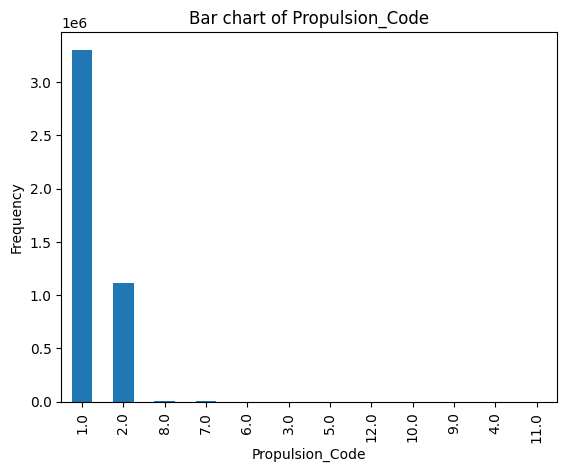

In [ ]:
# Select a categorical column of interest
cat_column = 'Propulsion_Code'

# Count the frequency of each category
cat_counts = dataset[cat_column].value_counts()

# Plot a bar chart of the category frequencies
cat_counts.plot.bar()

# Set the title and axis labels
plt.title('Bar chart of ' + cat_column)
plt.xlabel(cat_column)
plt.ylabel('Frequency')

# Display the plot
plt.show()

## Driver_Home_Area_Type

In [ ]:
dataset['Driver_Home_Area_Type'].value_counts().sort_values()

2.0     339782
3.0     448594
1.0    2714285
Name: Driver_Home_Area_Type, dtype: int64

In [ ]:
# As this column is categorical, we are replacing missing values with the mode category i.e. category 1.
dataset['Driver_Home_Area_Type'] = dataset['Driver_Home_Area_Type'].fillna(1)

In [ ]:
dataset['Driver_Home_Area_Type'].isna().sum()

0

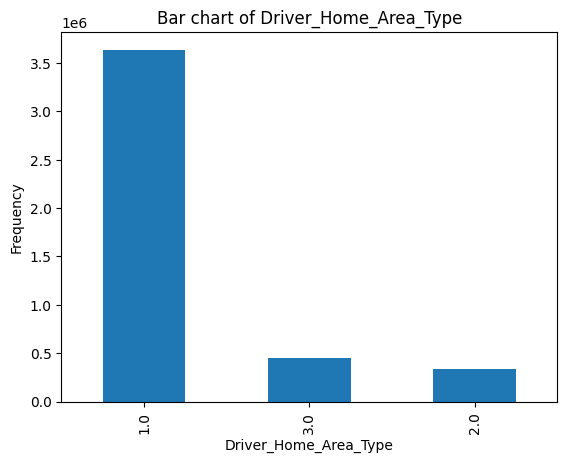

In [ ]:
# Select a categorical column of interest
cat_column = 'Driver_Home_Area_Type'

# Count the frequency of each category
cat_counts = dataset[cat_column].value_counts()

# Plot a bar chart of the category frequencies
cat_counts.plot.bar()

# Set the title and axis labels
plt.title('Bar chart of ' + cat_column)
plt.xlabel(cat_column)
plt.ylabel('Frequency')

# Display the plot
plt.show()

## Casualty_Home_Area_Type 

In [ ]:
dataset['Casualty_Home_Area_Type'].value_counts().sort_values()

2.0     348456
3.0     431790
1.0    2905811
Name: Casualty_Home_Area_Type, dtype: int64

In [ ]:
# As this column is categorical, we are replacing missing values with the mode category i.e. category 1.
dataset['Casualty_Home_Area_Type'] = dataset['Casualty_Home_Area_Type'].fillna(1)

In [ ]:
dataset['Casualty_Home_Area_Type'].isna().sum()

0

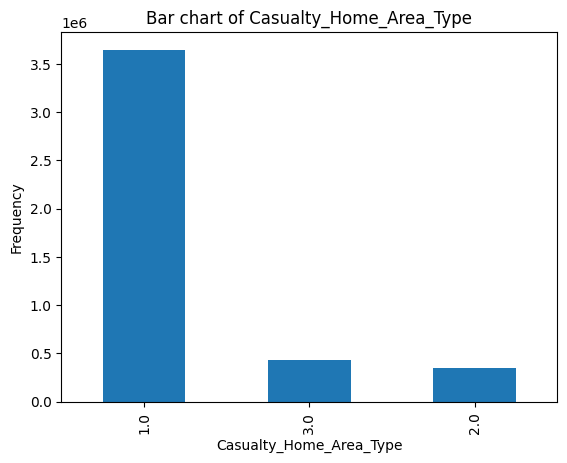

In [ ]:
# Select a categorical column of interest
cat_column = 'Casualty_Home_Area_Type'

# Count the frequency of each category
cat_counts = dataset[cat_column].value_counts()

# Plot a bar chart of the category frequencies
cat_counts.plot.bar()

# Set the title and axis labels
plt.title('Bar chart of ' + cat_column)
plt.xlabel(cat_column)
plt.ylabel('Frequency')

# Display the plot
plt.show()

## Age_of_Driver

In [ ]:
dataset['Age_of_Driver'].describe()

count    3.881929e+06
mean     3.873945e+01
std      1.582716e+01
min      1.000000e+00
25%      2.600000e+01
50%      3.700000e+01
75%      4.900000e+01
max      1.000000e+02
Name: Age_of_Driver, dtype: float64

<Axes: >

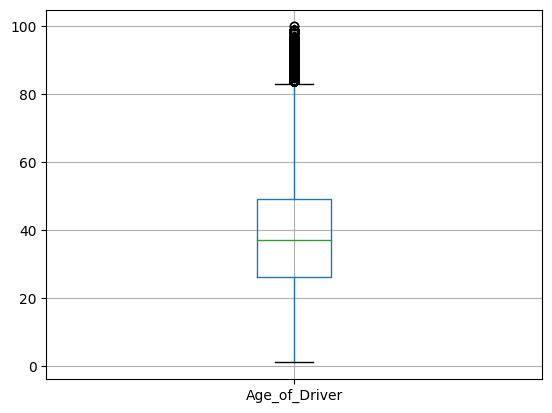

In [ ]:
dataset.boxplot(column='Age_of_Driver')

In [ ]:
Q1 = dataset['Age_of_Driver'].quantile(0.25)
Q3 = dataset['Age_of_Driver'].quantile(0.75)
IQR = Q3 - Q1
#print(Q1)
# Calculate the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print(lower_bound,upper_bound)
# Create a boolean mask to identify outliers
outliers = (dataset['Age_of_Driver'] < lower_bound) | (dataset['Age_of_Driver'] > upper_bound)

# Count the number of outliers
outlier_count = outliers.sum()
outlier_count

-8.5 83.5


24037

In [ ]:
(outlier_count/dataset.shape[0])*100

0.5428840452348414

In [ ]:
dataset['Age_of_Driver'].median()

37.0

In [ ]:
dataset.loc[(dataset['Age_of_Driver'] >= upper_bound) | (dataset['Age_of_Driver'] <= lower_bound), 'Age_of_Driver'] = 39

In [ ]:
outliers = (dataset['Age_of_Driver'] < lower_bound) | (dataset['Age_of_Driver'] > upper_bound)

# Count the number of outliers
outlier_count = outliers.sum()
outlier_count

0

<Axes: >

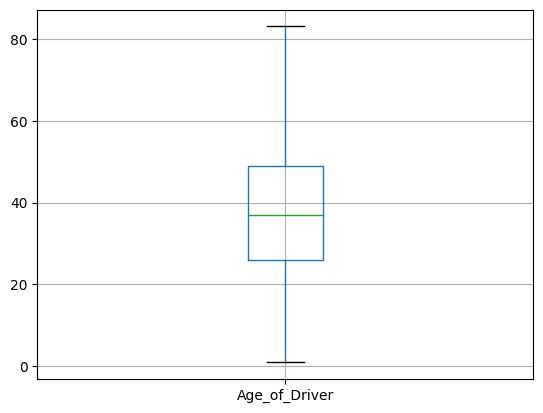

In [ ]:
dataset.boxplot(column='Age_of_Driver')

In [ ]:
#Filling the null values

dataset['Age_of_Driver'] = dataset['Age_of_Driver'].fillna(39)

## LSOA_of_Accident_Location

In [ ]:
dataset['LSOA_of_Accident_Location'].value_counts().sort_values()

W01001902       1
E01006098       1
E01032616       1
E01033381       1
E01032813       1
E01003385       1
E01032815       1
E01000949       1
E01033079       1
E01033364       1
E01032944       1
E01004739       1
E01032559       1
E01033734       1
E01032816       1
E01025677       1
E01013104       1
E01004784       1
E01011960       1
E01032818       1
E01026996       1
E01033599       1
E01018475       1
W01001919       1
E01033376       1
E01032712       1
W01001551       1
W01001918       1
W01001949       1
W01001958       1
E01033254       1
E01032705       1
E01028665       1
E01033476       1
E01019474       1
E01019640       1
E01033275       1
E01033430       1
E01033427       1
E01033064       1
E01032926       1
E01007520       1
E01021898       1
E01020721       1
E01032609       1
E01033305       1
E01021866       1
E01000584       1
E01003479       1
E01001702       1
E01025804       1
E01008718       1
E01004169       1
E01005531       1
E01006017       1
E01033163 

In [ ]:
# As this column is categorical, we are replacing missing values with the mode category i.e. category 282711.
dataset['LSOA_of_Accident_Location'] = dataset['LSOA_of_Accident_Location'].fillna(282711)

In [ ]:
dataset['LSOA_of_Accident_Location'].isna().sum()

0

##Age_of_Casualty

In [ ]:
dataset['Age_of_Casualty'].describe()

count    4.201620e+06
mean     3.561187e+01
std      1.787366e+01
min      0.000000e+00
25%      2.100000e+01
50%      3.300000e+01
75%      4.700000e+01
max      1.030000e+02
Name: Age_of_Casualty, dtype: float64

<Axes: >

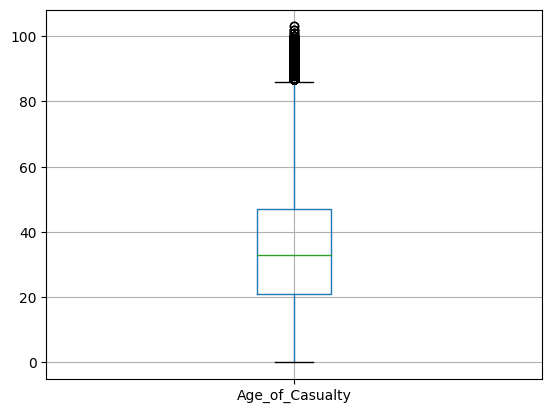

In [ ]:
dataset.boxplot(column='Age_of_Casualty')

In [ ]:
Q1 = dataset['Age_of_Casualty'].quantile(0.25)
Q3 = dataset['Age_of_Casualty'].quantile(0.75)
IQR = Q3 - Q1
#print(Q1)
# Calculate the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print(lower_bound,upper_bound)
# Create a boolean mask to identify outliers
outliers = (dataset['Age_of_Casualty'] < lower_bound) | (dataset['Age_of_Casualty'] > upper_bound)

# Count the number of outliers
outlier_count = outliers.sum()
outlier_count

-18.0 86.0


18835

In [ ]:
(outlier_count/dataset.shape[0])*100

0.4253950572866097

In [ ]:
dataset['Age_of_Casualty'].median()

33.0

In [ ]:
dataset.loc[(dataset['Age_of_Casualty'] > upper_bound) | (dataset['Age_of_Casualty'] < lower_bound), 'Age_of_Casualty'] = 33

In [ ]:
outliers = (dataset['Age_of_Casualty'] < lower_bound) | (dataset['Age_of_Casualty'] > upper_bound)

# Count the number of outliers
outlier_count = outliers.sum()
outlier_count

0

<Axes: >

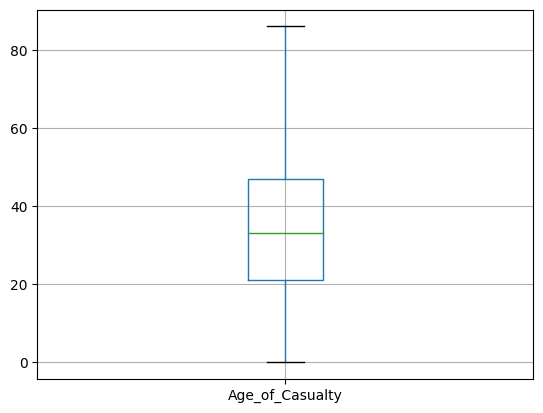

In [ ]:
dataset.boxplot(column='Age_of_Casualty')

In [ ]:
#Filling the null values

dataset['Age_of_Casualty'] = dataset['Age_of_Casualty'].fillna(33)

## Dropping nan rows

In [ ]:
null_percentage = (dataset.isnull().sum() / len(dataset)) * 100
null_percentage.sort_values(ascending=False)

Junction_Location                              3.474191
1st_Point_of_Impact                            3.217825
Vehicle_Manoeuvre                              3.193004
Sex_of_Casualty                                3.190135
Car_Passenger                                  3.182840
Vehicle_Type                                   3.175726
Towing_and_Articulation                        3.168454
Skidding_and_Overturning                       3.166940
Vehicle_Leaving_Carriageway                    3.166940
Hit_Object_in_Carriageway                      3.166105
Vehicle_Location-Restricted_Lane               3.165427
Bus_or_Coach_Passenger                         3.164862
Hit_Object_off_Carriageway                     3.164614
Sex_of_Driver                                  3.164253
Pedestrian_Movement                            3.163620
Pedestrian_Location                            3.163552
Casualty_Class                                 3.163214
Casualty_Reference                             3

In [ ]:
dataset.shape

(4427649, 57)

In [ ]:
dataset = dataset.dropna()

In [ ]:
dataset.isna().sum()

Location_Easting_OSGR                          0
Location_Northing_OSGR                         0
Longitude                                      0
Latitude                                       0
Police_Force                                   0
Accident_Severity                              0
Number_of_Vehicles                             0
Number_of_Casualties                           0
Date                                           0
Day_of_Week                                    0
Time                                           0
Local_Authority_(District)                     0
Local_Authority_(Highway)                      0
1st_Road_Class                                 0
1st_Road_Number                                0
Road_Type                                      0
Speed_limit                                    0
Junction_Detail                                0
2nd_Road_Number                                0
Pedestrian_Crossing-Human_Control              0
Pedestrian_Crossing-

In [ ]:
dataset.shape

(4217362, 57)

In [ ]:
dataset.isnull().sum()

Location_Easting_OSGR                          0
Location_Northing_OSGR                         0
Longitude                                      0
Latitude                                       0
Police_Force                                   0
Accident_Severity                              0
Number_of_Vehicles                             0
Number_of_Casualties                           0
Date                                           0
Day_of_Week                                    0
Time                                           0
Local_Authority_(District)                     0
Local_Authority_(Highway)                      0
1st_Road_Class                                 0
1st_Road_Number                                0
Road_Type                                      0
Speed_limit                                    0
Junction_Detail                                0
2nd_Road_Number                                0
Pedestrian_Crossing-Human_Control              0
Pedestrian_Crossing-

In [ ]:
duplicate = dataset[dataset.duplicated()]
duplicate

,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_(District),Local_Authority_(Highway),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location-Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,1st_Point_of_Impact,Sex_of_Driver,Age_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Casualty_Reference,Casualty_Class,Sex_of_Casualty,Age_of_Casualty,Casualty_Severity,Pedestrian_Location,Pedestrian_Movement,Car_Passenger,Bus_or_Coach_Passenger,Casualty_Type,Casualty_Home_Area_Type
409,526820.0,177790.0,-0.174920,51.484797,1,2,3,1,08/05/2005,1,19:15,12,E09000020,3,3217.0,6,30,0.0,0.0,0.0,0.0,1,1.0,1.0,0.0,0.0,1,1.0,E01002845,9.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,39.0,1598.0,1.0,7.0,2.0,1.0,1.0,3.0,1.0,35.0,2.0,5.0,1.0,0.0,0.0,0.0,1.0
905,526810.0,178190.0,-0.174921,51.488394,1,3,3,1,06/09/2005,3,00:10,12,E09000020,5,0.0,6,30,0.0,0.0,0.0,0.0,4,1.0,1.0,0.0,0.0,1,1.0,E01002910,9.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0,39.0,1598.0,1.0,7.0,2.0,1.0,1.0,1.0,1.0,31.0,3.0,0.0,0.0,0.0,0.0,9.0,1.0
2673,525280.0,182300.0,-0.195487,51.525672,1,3,5,1,01/04/2005,6,23:35,1,E09000033,5,0.0,6,30,3.0,0.0,0.0,0.0,4,1.0,1.0,0.0,0.0,1,1.0,E01004676,9.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0,1.0,39.0,1598.0,1.0,7.0,2.0,1.0,1.0,1.0,1.0,29.0,3.0,0.0,0.0,0.0,0.0,9.0,1.0
3107,526430.0,181360.0,-0.179256,51.516968,1,3,3,2,28/05/2005,7,15:20,1,E09000033,3,4205.0,3,30,0.0,0.0,0.0,0.0,1,1.0,1.0,0.0,0.0,1,1.0,E01004681,8.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,39.0,1598.0,1.0,7.0,2.0,1.0,1.0,3.0,2.0,9.0,3.0,5.0,4.0,0.0,0.0,0.0,1.0
3108,526430.0,181360.0,-0.179256,51.516968,1,3,3,2,28/05/2005,7,15:20,1,E09000033,3,4205.0,3,30,0.0,0.0,0.0,0.0,1,1.0,1.0,0.0,0.0,1,1.0,E01004681,8.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,39.0,1598.0,1.0,7.0,2.0,1.0,2.0,3.0,1.0,38.0,3.0,5.0,4.0,0.0,0.0,0.0,1.0
3151,529710.0,181360.0,-0.132010,51.516225,1,3,3,1,07/05/2005,7,03:00,1,E09000033,3,40.0,6,30,0.0,0.0,0.0,0.0,4,1.0,1.0,0.0,0.0,1,1.0,E01004763,11.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,39.0,1598.0,1.0,7.0,2.0,1.0,1.0,3.0,2.0,32.0,3.0,8.0,9.0,0.0,0.0,0.0,1.0
7118,525880.0,183920.0,-0.186264,51.540098,1,3,4,1,19/11/2005,7,04:30,2,E09000007,4,509.0,6,30,0.0,0.0,0.0,0.0,4,1.0,2.0,0.0,0.0,1,1.0,E01000935,9.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,39.0,1598.0,1.0,7.0,2.0,1.0,1.0,1.0,1.0,27.0,3.0,0.0,0.0,0.0,0.0,9.0,1.0
10822,538770.0,181190.0,-0.001585,51.512546,1,3,4,1,13/03/2005,1,13:45,5,E09000030,3,13.0,3,30,0.0,0.0,0.0,0.0,1,1.0,1.0,0.0,0.0,1,1.0,E01004245,9.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,39.0,1598.0,1.0,7.0,2.0,1.0,1.0,2.0,2.0,9.0,3.0,0.0,0.0,2.0,0.0,9.0,1.0
15731,546310.0,186600.0,0.109243,51.559257,1,3,4,1,29/11/2005,3,21:55,14,E09000026,4,177.0,6,30,3.0,0.0,0.0,0.0,4,1.0,2.0,0.0,0.0,1,1.0,E01003737,9.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0,1.0,41.0,1598.0,1.0,7.0,2.0,1.0,1.0,1.0,1.0,49.0,3.0,0.0,0.0,0.0,0.0,9.0,1.0
17423,552860.0,185250.0,0.203072,51.545392,1,3,3,2,05/10/2005,4,18:30,15,E09000016,5,0.0,6,30,8.0,0.0,0.0,0.0,1,1.0,1.0,0.0,0.0,1,2.0,E01002265,1.0,0.0,18.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,39.0,1598.0,1.0,7.0,8.0,1.0,1.0,1.0,1.0,33.0,3.0,0.0,0.0,0.0,0.0,1.0,1.0


In [ ]:
dataset = dataset.drop_duplicates()

NameError: ignored

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4215364 entries, 0 to 4287592
Data columns (total 57 columns):
 #   Column                                       Dtype  
---  ------                                       -----  
 0   Location_Easting_OSGR                        float64
 1   Location_Northing_OSGR                       float64
 2   Longitude                                    float64
 3   Latitude                                     float64
 4   Police_Force                                 int64  
 5   Accident_Severity                            int64  
 6   Number_of_Vehicles                           int64  
 7   Number_of_Casualties                         int64  
 8   Date                                         object 
 9   Day_of_Week                                  int64  
 10  Time                                         object 
 11  Local_Authority_(District)                   int64  
 12  Local_Authority_(Highway)                    object 
 13  1st_Road_Cla

In [ ]:
dataset.to_csv('cleaned.csv', index=False)

#Transformation and Correlations

In [ ]:
cleaned_data = pd.read_csv('/content/drive/Shared drives/DATA240/Data/cleaned.csv')

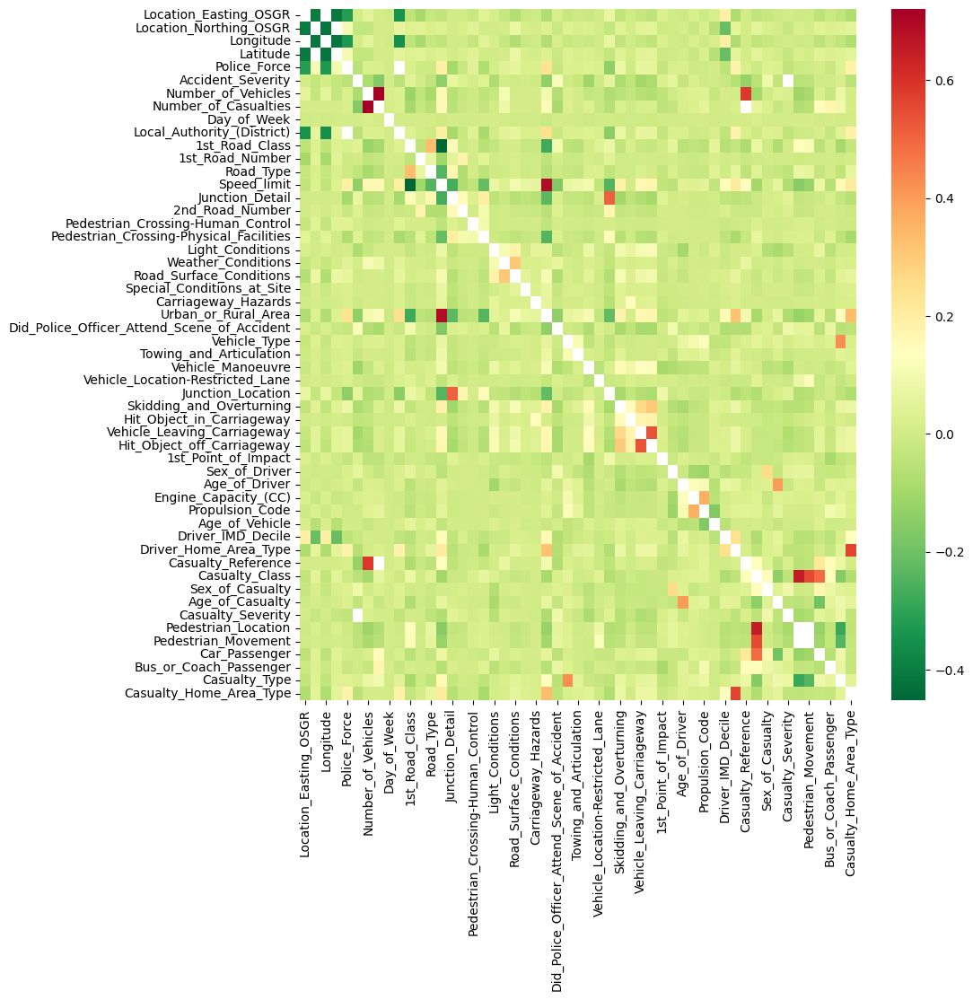

In [ ]:
c = cleaned_data.corr()
plt.figure(figsize=(10,10))
sns.heatmap(c, cmap='RdYlGn_r', mask = (np.abs(c) >= 0.8))
plt.show()

In [ ]:
# Step 2: Create boolean mask of upper triangle
mask = np.triu(np.ones_like(c, dtype=bool))

# Step 3: Replace upper triangle with NaN values
c = c.mask(mask)

# Step 4: Find correlated features
correlated_features = set()
for i in range(len(c.columns)):
    for j in range(i):
        if abs(c.iloc[i, j]) > 0.9:
            colname = c.columns[i]
            correlated_features.add(colname)

# Step 5: Print list of correlated features
print("Correlated Features: ", correlated_features)

Correlated Features:  {'Latitude', 'Local_Authority_(District)', 'Longitude'}


Thus Dropping Latitude and longitude as they have highly co related

In [ ]:
cleaned_data = cleaned_data.drop(['Longitude','Latitude'], axis=1)

In [ ]:
cleaned_data.info()

In [ ]:
# convert the date column to datetime objects
cleaned_data['Date'] = pd.to_datetime(cleaned_data['Date'], format='%d/%m/%Y')

# create new columns without overwriting existing data
cleaned_data['year'] = cleaned_data['Date'].dt.year.astype(float)
cleaned_data['month'] = cleaned_data['Date'].dt.month.astype(float)
cleaned_data['day'] = cleaned_data['Date'].dt.day.astype(float)
cleaned_data = cleaned_data.drop('Date', axis=1)

In [ ]:
# Convert Time column to datetime format
cleaned_data['Time'] = pd.to_datetime(cleaned_data['Time'], format='%H:%M')

# Extract hour into a new column
cleaned_data['Time'] = cleaned_data['Time'].dt.hour.astype(int)


In [ ]:
# select columns of type 'object'
obj_cols = cleaned_data.select_dtypes(include=['object']).columns

# convert selected columns to string type using applymap
cleaned_data[obj_cols] = cleaned_data[obj_cols].applymap(str)



In [ ]:
from sklearn.preprocessing import LabelEncoder

# create a LabelEncoder object
le = LabelEncoder()

# fit and transform the object datatype column in the dataframe
cleaned_data['LSOA_of_Accident_Location'] = le.fit_transform(cleaned_data['LSOA_of_Accident_Location'])
cleaned_data['Local_Authority_(Highway)'] = le.fit_transform(cleaned_data['Local_Authority_(Highway)'])


In [ ]:
cleaned_data.info()

In [ ]:
cleaned_data.to_csv('processed_data.csv', index=False)

#Visualising the Target Feature Severity_index

In [ ]:
# Load data
processed_data = pd.read_csv('/content/drive/Shared drives/DATA240/Data/processed_data.csv')

In [ ]:
print(processed_data.head(5))

   Location_Easting_OSGR  Location_Northing_OSGR  Police_Force  \
0               525680.0                178240.0             1   
1               524170.0                181650.0             1   
2               524520.0                182240.0             1   
3               524520.0                182240.0             1   
4               526900.0                177530.0             1   

   Accident_Severity  Number_of_Vehicles  Number_of_Casualties  Day_of_Week  \
0                  2                   1                     1            3   
1                  3                   1                     1            4   
2                  3                   2                     1            5   
3                  3                   2                     1            5   
4                  3                   1                     1            6   

   Time  Local_Authority_(District)  Local_Authority_(Highway)  \
0    17                          12                        111

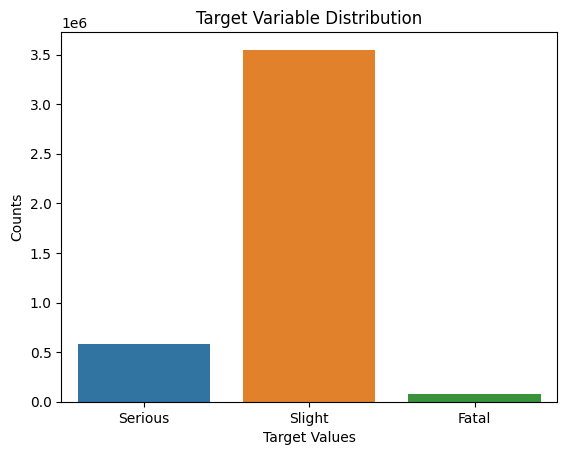

In [ ]:
# Copy the processed_data dataframe to a new dataframe
plot_data = processed_data.copy()

# Rename the values for plotting
plot_data['Accident_Severity'] = plot_data['Accident_Severity'].replace({1: 'Fatal', 2: 'Serious', 3: 'Slight'})

# Count the values of the target variable
counts = plot_data['Accident_Severity'].value_counts()

# Create a bar plot using seaborn
sns.countplot(x='Accident_Severity', data=plot_data)

# Set the plot title and axis labels
plt.title('Target Variable Distribution')
plt.xlabel('Target Values')
plt.ylabel('Counts')

# Show the plot
plt.show()



#Normalization


In [ ]:
# Split data into features (X) and target variable (y)
X = processed_data.drop('Accident_Severity', axis=1)
y = processed_data['Accident_Severity']

In [ ]:
# Apply MinMax scaling to X
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)



In [ ]:
# Apply RandomUnderSampler to balance the classes
rus = RandomUnderSampler(random_state=42)
X_res, y_res = rus.fit_resample(X_scaled, y)
print('Resampled dataset shape %s' % Counter(y_res))

Resampled dataset shape Counter({1: 80596, 2: 80596, 3: 80596})


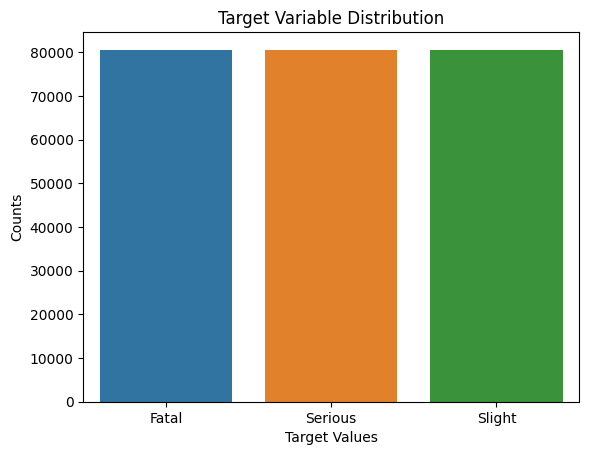

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter

# Define a dictionary to map the numerical values to their string labels
label_map = {1: 'Fatal', 2: 'Serious', 3: 'Slight'}

# Convert the numerical values in y_res to their string labels
y_res_str = [label_map[val] for val in y_res]

# Count the values of the target variable
counts = Counter(y_res_str)

# Create a bar plot using seaborn
sns.countplot(x=y_res_str)

# Set the plot title and axis labels
plt.title('Target Variable Distribution')
plt.xlabel('Target Values')
plt.ylabel('Counts')

# Show the plot
plt.show()


#Modelling

In [ ]:
# Splitting data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

In [ ]:
# Creating and fitting the decision tree model
dtc = DecisionTreeClassifier(random_state=42)
dtc.fit(X_train, y_train)

# Predicting on the test set
y_pred = dtc.predict(X_test)

# Evaluating the model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))
print('\nClassification Report:\n', classification_report(y_test, y_pred))
print('\nAccuracy:', accuracy_score(y_test, y_pred))


Confusion Matrix:
 [[14117  1270   549]
 [ 1750 12625  1584]
 [  843  1970 13650]]

Classification Report:
               precision    recall  f1-score   support

           1       0.84      0.89      0.86     15936
           2       0.80      0.79      0.79     15959
           3       0.86      0.83      0.85     16463

    accuracy                           0.84     48358
   macro avg       0.84      0.84      0.83     48358
weighted avg       0.84      0.84      0.84     48358


Accuracy: 0.8352702758592166


In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Train the Random Forest classifier
rfc = RandomForestClassifier(random_state=42)
rfc.fit(X_train, y_train)

# Predict on the test set
y_pred_rfc = rfc.predict(X_test)

# Evaluate the Random Forest classifier
from sklearn.metrics import classification_report, accuracy_score

print('Random Forest Classification Report:')
print(classification_report(y_test, y_pred_rfc))
print('Accuracy:', accuracy_score(y_test, y_pred_rfc))


Random Forest Classification Report:
              precision    recall  f1-score   support

           1       0.93      0.93      0.93     15936
           2       0.89      0.84      0.86     15959
           3       0.87      0.93      0.90     16463

    accuracy                           0.90     48358
   macro avg       0.90      0.90      0.90     48358
weighted avg       0.90      0.90      0.90     48358

Accuracy: 0.8965010959923901


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

# Create the Naive Bayes model
gnb = GaussianNB()

# Train the model on the training data
gnb.fit(X_train, y_train)

# Make predictions on the testing data
y_pred_gnb = gnb.predict(X_test)

# Evaluate the accuracy of the model
print(classification_report(y_test, y_pred_gnb))
print('Accuracy:', accuracy_score(y_test, y_pred_gnb))



              precision    recall  f1-score   support

           1       0.65      0.69      0.67     15936
           2       0.83      0.38      0.52     15959
           3       0.67      0.98      0.79     16463

    accuracy                           0.69     48358
   macro avg       0.72      0.68      0.66     48358
weighted avg       0.72      0.69      0.66     48358

Accuracy: 0.6865048182306961


#Feature Selection

ANNOVA

In [ ]:
# Apply ANOVA to get F-scores and p-values for each feature
f_scores, p_values = f_classif(X_res, y_res)

# Create a DataFrame with feature names, F-scores, and p-values
anova_results = pd.DataFrame({'feature': X.columns, 'F-score': f_scores, 'p-value': p_values})

# Sort the DataFrame by F-score in descending order
anova_results = anova_results.sort_values('F-score', ascending=False)

# Print the top 10 features with highest F-scores
print(anova_results.head(15))





                                        feature       F-score  p-value
46                            Casualty_Severity  89804.533300      0.0
12                                  Speed_limit  14731.762327      0.0
22                          Urban_or_Rural_Area  12753.854820      0.0
23  Did_Police_Officer_Attend_Scene_of_Accident   8095.342602      0.0
27                            Vehicle_Manoeuvre   5465.905830      0.0
9                                1st_Road_Class   3848.771027      0.0
29                            Junction_Location   3698.934785      0.0
13                              Junction_Detail   3529.043288      0.0
4                          Number_of_Casualties   3269.026282      0.0
32                  Vehicle_Leaving_Carriageway   3168.233141      0.0
17                             Light_Conditions   2994.139368      0.0
33                   Hit_Object_off_Carriageway   2326.492588      0.0
30                     Skidding_and_Overturning   2289.120226      0.0
42    

CHI sqaure


In [ ]:
from sklearn.feature_selection import SelectKBest, chi2

# Select the top 10 features based on chi-square test
selector = SelectKBest(chi2, k=15)
selector.fit(X_res, y_res)

# Get the indices of the selected features
feature_indices = selector.get_support(indices=True)

# Get the names of the selected features
selected_features = list(X.columns[feature_indices])

# Get the chi-square scores and p-values for all features
scores = selector.scores_
p_values = selector.pvalues_

# Create a DataFrame with feature names, chi-square scores, and p-values
chi2_results = pd.DataFrame({'feature': X.columns, 'chi2-score': scores, 'p-value': p_values})

# Sort the DataFrame by chi-square scores in descending order
chi2_results = chi2_results.sort_values('chi2-score', ascending=False)

# Print the top 10 features with highest chi-square scores
print(chi2_results.head(15))


                                        feature    chi2-score  p-value
46                            Casualty_Severity  21562.112132      0.0
23  Did_Police_Officer_Attend_Scene_of_Accident   7068.618337      0.0
22                          Urban_or_Rural_Area   5219.310751      0.0
29                            Junction_Location   4046.594809      0.0
32                  Vehicle_Leaving_Carriageway   3822.887420      0.0
12                                  Speed_limit   3120.328119      0.0
33                   Hit_Object_off_Carriageway   2982.142238      0.0
17                             Light_Conditions   2824.564576      0.0
44                              Sex_of_Casualty   2627.342966      0.0
13                              Junction_Detail   2486.847687      0.0
30                     Skidding_and_Overturning   2111.771641      0.0
41                        Driver_Home_Area_Type   2015.826478      0.0
35                                Sex_of_Driver   1776.268487      0.0
52    

Random Forrest

In [ ]:

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

# Create the Random Forest model
rf = RandomForestClassifier()

# Train the model on the training data
rf.fit(X_train, y_train)

# Use feature_importances_ to get feature importance scores
importances = rf.feature_importances_

# Create a DataFrame with feature names and importance scores
feature_importances = pd.DataFrame({'feature': X.columns, 'importance': importances})

# Sort the DataFrame by importance score in descending order
feature_importances = feature_importances.sort_values('importance', ascending=False)

# Print the top 10 features with highest importance scores
print(feature_importances.head(15))


                       feature  importance
46           Casualty_Severity    0.356732
4         Number_of_Casualties    0.054854
12                 Speed_limit    0.025411
42          Casualty_Reference    0.025024
0        Location_Easting_OSGR    0.023502
1       Location_Northing_OSGR    0.023439
45             Age_of_Casualty    0.021884
24   LSOA_of_Accident_Location    0.021749
10             1st_Road_Number    0.021687
6                         Time    0.021093
7   Local_Authority_(District)    0.020309
55                         day    0.020124
8    Local_Authority_(Highway)    0.019207
36               Age_of_Driver    0.018729
51               Casualty_Type    0.018711


Logistic Regression

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

# Create the Logistic Regression model
lr = LogisticRegression()

# Fit the model on the training data
lr.fit(X_train, y_train)

# Use the SelectFromModel method to select the top 10 features based on the logistic regression coefficients
sfm = SelectFromModel(lr, threshold='median', max_features=15)
sfm.fit(X_train, y_train)

# Get the indices of the selected features
feature_indices = sfm.get_support(indices=True)

# Get the names of the selected features
selected_features = list(X.columns[feature_indices])

# Create a DataFrame with the selected feature names and their coefficients
lr_results = pd.DataFrame({'feature': selected_features, 'coefficient': abs(lr.coef_[0][feature_indices])})

# Sort the DataFrame by coefficient in descending order
lr_results = lr_results.sort_values('coefficient', ascending=False)

# Print the top 10 features with highest coefficients
print(lr_results.head(15))



                                        feature  coefficient
3                          Number_of_Casualties    15.241869
11                            Casualty_Severity    11.549108
2                            Number_of_Vehicles     3.849388
14                                Casualty_Type     2.731317
7   Did_Police_Officer_Attend_Scene_of_Accident     2.667354
1                                  Police_Force     1.464640
4                    Local_Authority_(District)     1.417720
6                                   Speed_limit     1.324304
13                          Pedestrian_Movement     1.221582
10                           Casualty_Reference     1.215714
12                          Pedestrian_Location     1.143325
9                               Propulsion_Code     1.068117
5                                     Road_Type     1.052924
8                                  Vehicle_Type     0.990605
0                        Location_Northing_OSGR     0.615067


#Selecting top 15

In [ ]:
# Merge the results into a single DataFrame
merged_results = pd.merge(anova_results, chi2_results, on='feature')
merged_results = pd.merge(merged_results, feature_importances, on='feature')
merged_results = pd.merge(merged_results, lr_results, on='feature')
merged_results['overall_score'] = merged_results['F-score'] + merged_results['chi2-score'] + merged_results['importance'] + merged_results['coefficient']
merged_results = merged_results.sort_values('overall_score', ascending=False)

# Get the top 10 features with highest overall score
top_features = merged_results.head(15)['feature'].tolist()

# Create a new DataFrame with only the top 15 features
top_features

['Casualty_Severity',
 'Speed_limit',
 'Did_Police_Officer_Attend_Scene_of_Accident',
 'Number_of_Casualties',
 'Casualty_Reference',
 'Police_Force',
 'Local_Authority_(District)',
 'Pedestrian_Location',
 'Casualty_Type',
 'Pedestrian_Movement',
 'Number_of_Vehicles',
 'Vehicle_Type',
 'Location_Northing_OSGR',
 'Road_Type',
 'Propulsion_Code']

In [ ]:
top_features = {
    'Casualty_Severity': [],
    'Speed_limit': [],
    'Did_Police_Officer_Attend_Scene_of_Accident': [],
    'Number_of_Casualties': [],
    'Casualty_Reference': [],
    'Police_Force': [],
    'Local_Authority_(District)': [],
    'Pedestrian_Location': [],
    'Casualty_Type': [],
    'Pedestrian_Movement': [],
    'Number_of_Vehicles': [],
    'Vehicle_Type': [],
    'Location_Northing_OSGR': [],
    'Road_Type': [],
    'Propulsion_Code': []
}

In [ ]:
top_features = {
    'Casualty_Severity': [],
    'Speed_limit': [],
    'Number_of_Casualties': [],
    'Light_Conditions': [],
    'Urban_or_Rural_Area': [],
    'Vehicle_Manoeuvre': [],
    'Did_Police_Officer_Attend_Scene_of_Accident': [],
    'Local_Authority_(District)': [],
    'Number_of_Vehicles': [],
    'Vehicle_Type': [],
    'Road_Type': [],
    'Pedestrian_Location': [],
    'Junction_Location': [],
    'Junction_Detail': [],
    'Skidding_and_Overturning': []
}

In [ ]:
# Create a new DataFrame with only the top 10 features
X_top = X.loc[:, top_features]

In [ ]:
# Apply MinMax scaling to X
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X_top)



In [ ]:
# Apply RandomUnderSampler to balance the classes
rus = RandomUnderSampler(random_state=42)
X_top_res, y_res = rus.fit_resample(X_scaled, y)
print('Resampled dataset shape %s' % Counter(y_res))

Resampled dataset shape Counter({1: 80596, 2: 80596, 3: 80596})


#Modelling Modelling with feature selection

In [ ]:
# Splitting data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_top_res, y_res, test_size=0.2, random_state=42)

In [ ]:
# Creating and fitting the decision tree model
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)

# Predicting on the test set
y_pred = dtc.predict(X_test)

# Evaluating the model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
accuracy = accuracy_score(y_test, y_pred)

print('\nClassification Report:\n', classification_report(y_test, y_pred))
print('\nAccuracy:', accuracy_score(y_test, y_pred))



Classification Report:
               precision    recall  f1-score   support

           1       0.85      0.90      0.88     15936
           2       0.82      0.80      0.81     15959
           3       0.87      0.83      0.85     16463

    accuracy                           0.85     48358
   macro avg       0.84      0.85      0.84     48358
weighted avg       0.85      0.85      0.84     48358


Accuracy: 0.8451342073700319


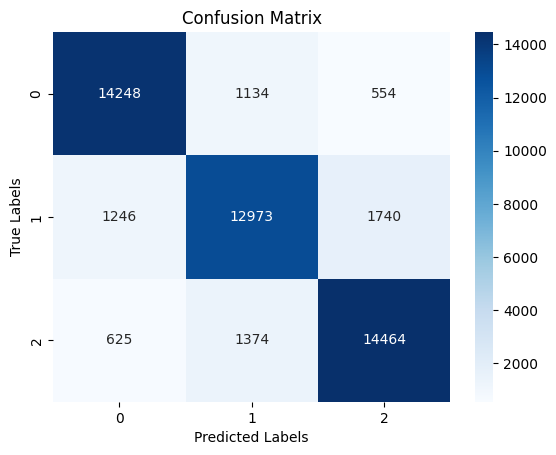


 Random Forest Classification Report:
               precision    recall  f1-score   support

           1       0.88      0.89      0.89     15936
           2       0.84      0.81      0.83     15959
           3       0.86      0.88      0.87     16463

    accuracy                           0.86     48358
   macro avg       0.86      0.86      0.86     48358
weighted avg       0.86      0.86      0.86     48358


Accuracy: 0.8620083543570868


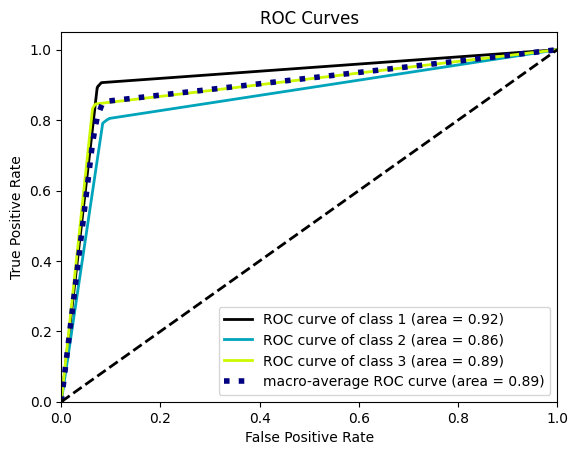

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Train the Random Forest classifier
rfc = RandomForestClassifier(random_state=42)
rfc.fit(X_train, y_train)

# Predict on the test set
y_pred_rfc = rfc.predict(X_test)

# Evaluate the Random Forest classifier
from sklearn.metrics import classification_report, accuracy_score
accuracy = accuracy_score(y_test, y_pred_rfc)
cm = confusion_matrix(y_test,y_pred_rfc)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

print('\n Random Forest Classification Report:\n', classification_report(y_test, y_pred_rfc))
print('\nAccuracy:', accuracy_score(y_test, y_pred_rfc))
skplt.metrics.plot_roc(y_test, dtc.predict_proba(X_test),plot_micro=False)
plt.show()

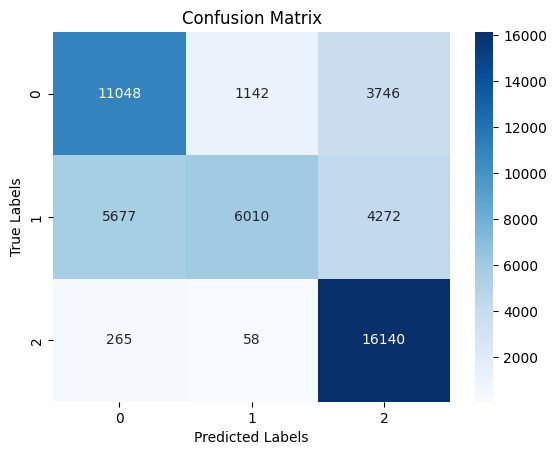


 Naive  Bayes Classification Report:
               precision    recall  f1-score   support

           1       0.65      0.69      0.67     15936
           2       0.83      0.38      0.52     15959
           3       0.67      0.98      0.79     16463

    accuracy                           0.69     48358
   macro avg       0.72      0.68      0.66     48358
weighted avg       0.72      0.69      0.66     48358


Accuracy: 0.6865048182306961


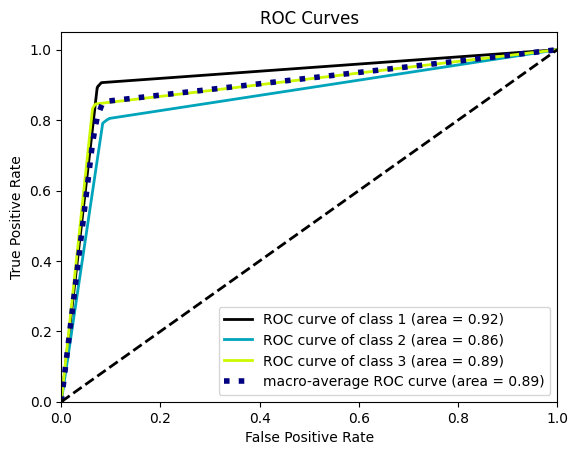

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

# Create the Naive Bayes model
gnb = GaussianNB()

# Train the model on the training data
gnb.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = gnb.predict(X_test)

# Evaluate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

print('\n Naive  Bayes Classification Report:\n', classification_report(y_test, y_pred))
print('\nAccuracy:', accuracy_score(y_test, y_pred))
skplt.metrics.plot_roc(y_test, dtc.predict_proba(X_test),plot_micro=False)
plt.show()

#Hyper parameter tuning for Rf

In [ ]:
!pip install optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 365.7/365.7 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.3/224.3 kB 27.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 10.7 MB/s eta 0:00:00


In [ ]:
import optuna
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

def objective(trial):
    # Define the hyperparameters to search over
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 1, 50),
        'max_features': trial.suggest_categorical('max_features', ['auto', 'sqrt']),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
        'class_weight': trial.suggest_categorical('class_weight', ['balanced', 'balanced_subsample', None])
    }

    # Create a RandomForestClassifier with the current set of hyperparameters
    rfc = RandomForestClassifier(**param)

    # Train the model and get the accuracy score
    rfc.fit(X_train, y_train)
    y_pred = rfc.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)

    return accuracy

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_top_res, y_res, test_size=0.2, random_state=42)

# Define the study object and start the optimization process
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Print the best hyperparameters found
best_params = study.best_params
print('Best hyperparameters:', best_params)

# Train the model with the best hyperparameters and get the accuracy score
rfc_tuned = RandomForestClassifier(**best_params)
rfc_tuned.fit(X_train, y_train)
y_pred_tuned = rfc_tuned.predict(X_test)
accuracy_tuned = accuracy_score(y_test, y_pred_tuned)

print('Accuracy with tuned hyperparameters:', accuracy_tuned)


[I 2023-05-17 01:56:59,839] A new study created in memory with name: no-name-50d6cb35-6434-4c9e-8a6f-03417aab2bf2
[I 2023-05-17 01:58:56,756] Trial 0 finished with value: 0.8079945407171513 and parameters: {'n_estimators': 848, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_split': 12, 'min_samples_leaf': 13, 'bootstrap': False, 'class_weight': 'balanced'}. Best is trial 0 with value: 0.8079945407171513.
[I 2023-05-17 01:59:50,101] Trial 1 finished with value: 0.830121179535961 and parameters: {'n_estimators': 311, 'max_depth': 35, 'max_features': 'auto', 'min_samples_split': 17, 'min_samples_leaf': 18, 'bootstrap': False, 'class_weight': 'balanced'}. Best is trial 1 with value: 0.830121179535961.
[I 2023-05-17 02:00:16,368] Trial 2 finished with value: 0.8262128293146945 and parameters: {'n_estimators': 162, 'max_depth': 15, 'max_features': 'sqrt', 'min_samples_split': 12, 'min_samples_leaf': 11, 'bootstrap': False, 'class_weight': 'balanced'}. Best is trial 1 with value: 0.830

In [ ]:
best_params

{'n_estimators': 827,
 'max_depth': 38,
 'max_features': 'sqrt',
 'min_samples_split': 7,
 'min_samples_leaf': 1,
 'bootstrap': False,
 'class_weight': 'balanced_subsample'}

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Train a Random Forest classifier with the best hyperparameters
rfc = RandomForestClassifier(n_estimators= 827, max_depth= 38, max_features ='sqrt', min_samples_split= 7, 
               min_samples_leaf= 1, bootstrap = False, class_weight ='balanced_subsample')
rfc.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rfc.predict(X_test)

# Evaluate the Random Forest classifier
from sklearn.metrics import classification_report, accuracy_score

print('Random Forest Classification Report (with best hyperparameters):')
print(classification_report(y_test, y_pred))
print('Accuracy:', accuracy_score(y_test, y_pred))


Random Forest Classification Report (with best hyperparameters):
              precision    recall  f1-score   support

           1       0.89      0.88      0.89     15936
           2       0.84      0.82      0.83     15959
           3       0.86      0.89      0.87     16463

    accuracy                           0.86     48358
   macro avg       0.86      0.86      0.86     48358
weighted avg       0.86      0.86      0.86     48358

Accuracy: 0.8638901526117705


In [ ]:
# Splitting data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_top_res, y_res, test_size=0.2, random_state=42)

# Creating and fitting the decision tree model
dtc = DecisionTreeClassifier(max_depth= 38, max_features ='sqrt', min_samples_split= 7, 
               min_samples_leaf= 1, bootstrap = False, class_weight ='balanced_subsample')
dtc.fit(X_train, y_train)

# Predicting on the test set
y_pred = dtc.predict(X_test)

# Evaluating the model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
accuracy = accuracy_score(y_test, y_pred)
# cm = confusion_matrix(y_test,y_pred)
# sns.heatmap(cm, annot=True, cmap='Blues', fmt='d')
# plt.title('Confusion Matrix')
# plt.xlabel('Predicted Labels')
# plt.ylabel('True Labels')
# plt.show()

print('\nClassification Report:\n', classification_report(y_test, y_pred))
print('\nAccuracy:', accuracy_score(y_test, y_pred))

skplt.metrics.plot_roc(y_test, dtc.predict_proba(X_test),plot_micro=False)
plt.show()